In [37]:
import pandas as pd
import numpy as np
from zlib import crc32

# import dataset
df = pd.read_csv("nyc_house_price_dataset.csv")
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [39]:
# name, host_name, nh group, nh, room type, last_review -> are categorical values

In [40]:
# check number of values per column
cat_list = ['name', 'host_name', 'neighbourhood_group', 'neighbourhood', 'room_type', 'last_review']

for i in cat_list:
    print()
    print(f"** Column: {i} **")
    print(df[i].value_counts())


** Column: name **
Hillside Hotel                                  18
Home away from home                             17
New york Multi-unit building                    16
Brooklyn Apartment                              12
Private Room                                    11
                                                ..
Luxury Studio Apt in NYC Financial District!     1
Large Room in Historical Neighborhood            1
1-Bd Apt in PRIME Soho - NYC- July               1
Bushwick Awesome Apartment                       1
Bright, modern apartment                         1
Name: name, Length: 47905, dtype: int64

** Column: host_name **
Michael         417
David           403
Sonder (NYC)    327
John            294
Alex            279
               ... 
Bengu             1
Kelsi             1
Meya              1
Dan & Bliss       1
Takara            1
Name: host_name, Length: 11452, dtype: int64

** Column: neighbourhood_group **
Manhattan        21661
Brooklyn         20104
Queens  

In [41]:
'''
 - getting rid of categorical values with extensive lengths: name, host, name
 - last review can be grouped into YYYY-MM instead of YYYY-MM-DD for bringing down the length (later in DATA CLEANING)
'''

'\n - getting rid of categorical values with extensive lengths: name, host, name\n - last review can be grouped into YYYY-MM instead of YYYY-MM-DD for bringing down the length (later in DATA CLEANING)\n'

In [42]:
# summary of numerical data types
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


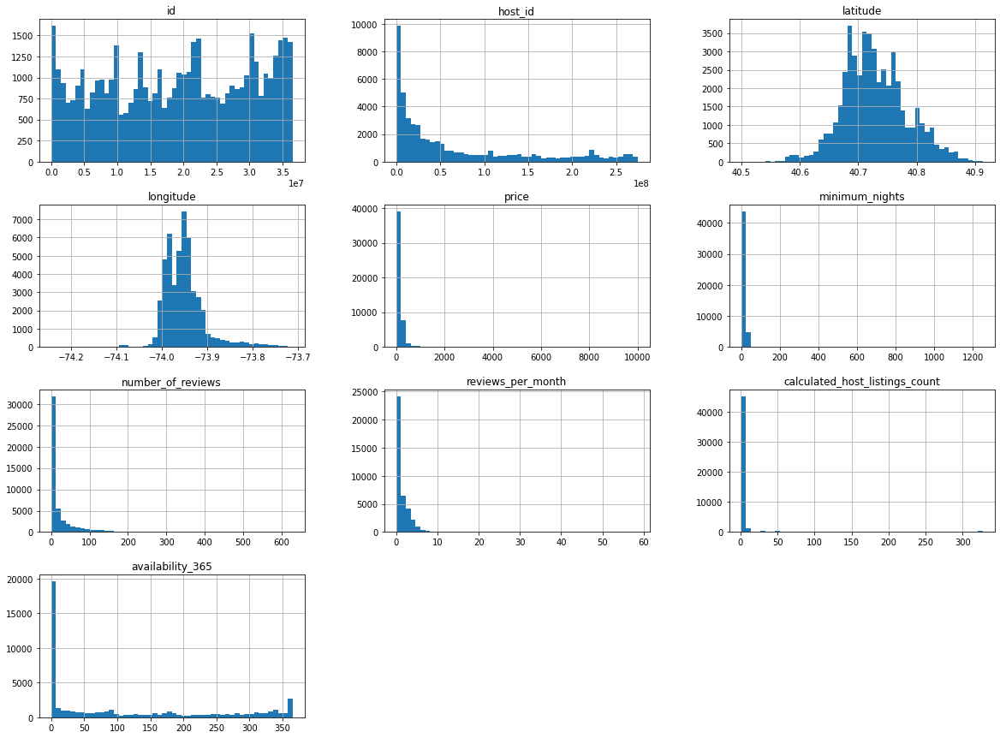

In [43]:
# plot numerical data types
%matplotlib inline
import matplotlib.pyplot as plt
df.hist(bins=50, figsize=(20,15))
plt.show()

In [51]:
# create test set - technique avoid using same data in test/train set over multiple runs
def test_set_check(id, test_ratio):
    return crc32(np.int64(id)) & 0xffffffff < test_ratio * 2**32

def split_train_test_by_id(data, test_ratio, id_col):
    ids = data[id_col]
    in_test_set = ids.apply(lambda id_: test_set_check(id_, test_ratio))
    return data.loc[~in_test_set], data.loc[in_test_set]

df_with_id = df.reset_index()
train_set, test_set = split_train_test_by_id(df_with_id, .2, "index")

In [52]:
print(f"Train set has {len(train_set)}; and, Test set has {len(test_set)} records.")

Train set has 39117; and, Test set has 9778 records.


In [54]:
test_set.head()

,index,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2,2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
5,5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
12,12,5803,"Lovely Room 1, Garden, Best Area, Legal rental",9744,Laurie,Brooklyn,South Slope,40.66829,-73.98779,Private room,89,4,167,2019-06-24,1.34,3,314
16,16,7097,Perfect for Your Parents + Garden,17571,Jane,Brooklyn,Fort Greene,40.69169,-73.97185,Entire home/apt,215,2,198,2019-06-28,1.72,1,321
23,23,8110,CBG Helps Haiti Rm #2,22486,Lisel,Brooklyn,Park Slope,40.68001,-73.97865,Private room,110,2,71,2019-07-02,0.61,6,304


<AxesSubplot:xlabel='longitude', ylabel='latitude'>

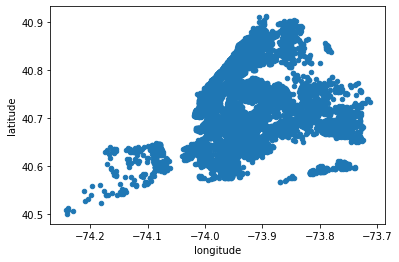

In [62]:
# visualize GEO data for inference

# work with copy to play around
df_train_copy = train_set.copy()
df_train_copy.plot(kind="scatter", x="longitude", y="latitude")

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

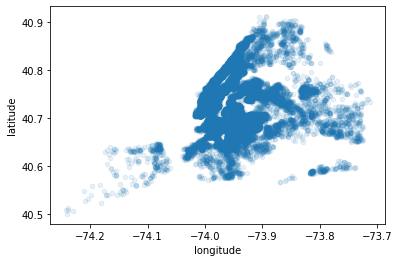

In [63]:
# axis=1 to view high density data points (this is Cali's map)
df_train_copy.plot(kind="scatter", x="longitude", y="latitude", alpha=0.1)

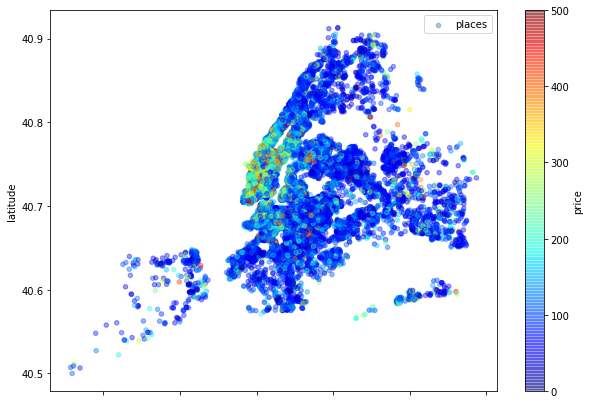

In [73]:
# explore prices w/ colors to represent density of AirBnbs (removing outliers just for view)
df_train_copy = df_train_copy.loc[df_train_copy["price"] <= 1500]

df_train_copy.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4,
    label="places", figsize=(10,7),
    c="price", cmap=plt.get_cmap("jet"), colorbar=True
    )
plt.legend()

In [74]:
# correlation matrix
corr_matrix = df.corr()
corr_matrix["price"].sort_values(ascending=False)

price                             1.000000
availability_365                  0.081829
calculated_host_listings_count    0.057472
minimum_nights                    0.042799
latitude                          0.033939
host_id                           0.015309
id                                0.010619
reviews_per_month                -0.030608
number_of_reviews                -0.047954
longitude                        -0.150019
Name: price, dtype: float64